<a href="https://colab.research.google.com/github/ronee12/Computer-Vision-Deep-learning-Work-Shop/blob/master/Image_Augmention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<class 'imageio.core.util.Array'>


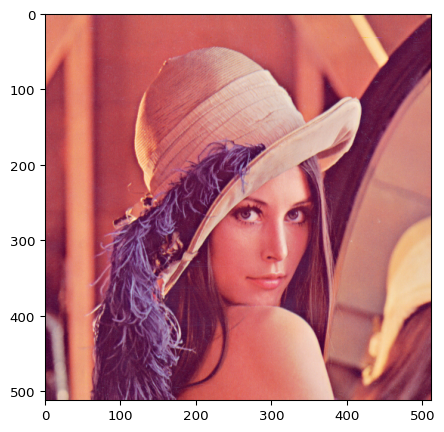

In [3]:
import imageio
import imgaug as ia

image = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")

print(type(image))

ia.imshow(image)

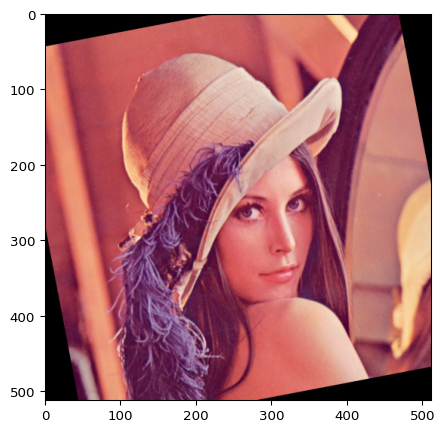

In [6]:
from imgaug import augmenters as iaa
ia.seed(1)

rotate = iaa.Affine(rotate=(-25,25))
image_aug = rotate(image = image)
ia.imshow(image_aug)

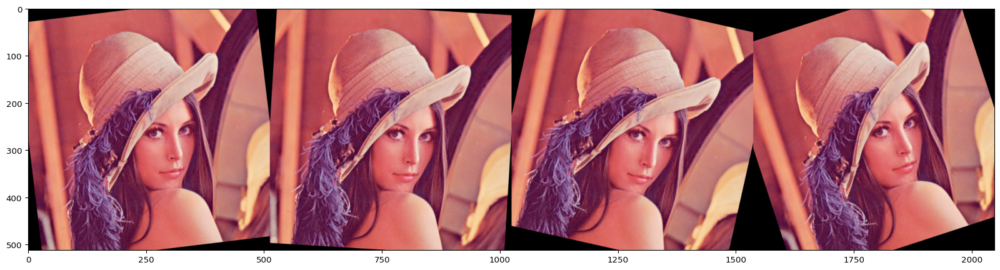

In [9]:
import numpy as np
images = [image, image, image, image]
images_aug = rotate(images = images)
ia.imshow(np.hstack(images_aug))

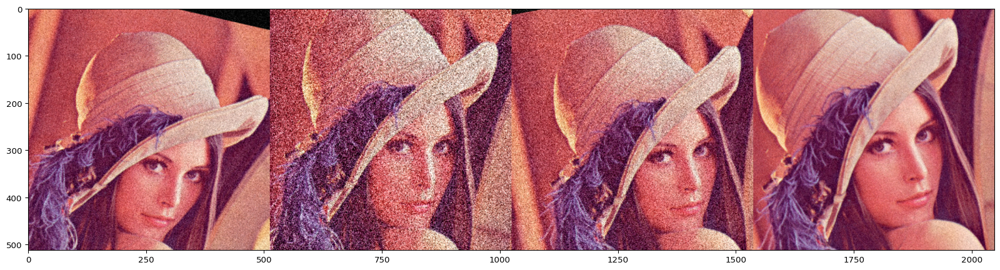

In [12]:
seq = iaa.Sequential([
                      iaa.Affine(rotate=(-25,25)),
                      iaa.AdditiveGaussianNoise(scale=(10,60)),
                      iaa.Crop(percent=(0,0.2))
])

images_aug = seq(images = images)
ia.imshow(np.hstack(images_aug))


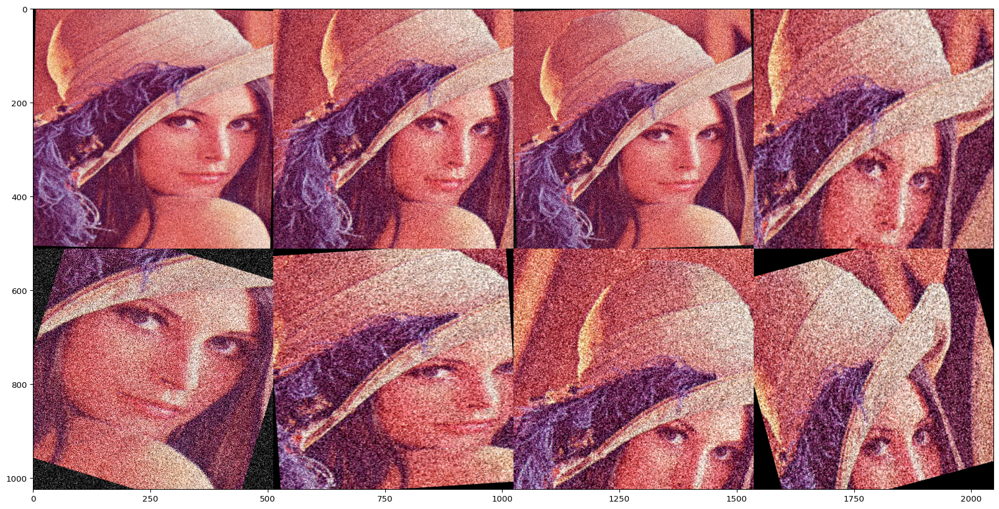

In [13]:
seq = iaa.Sequential([
                      iaa.Affine(rotate=(-25,25)),
                      iaa.AdditiveGaussianNoise(scale=(30,90)),
                      iaa.Crop(percent=(0,0.4))
], random_order = True)

images_aug = [seq(image = image) for _ in range(8)]

ia.imshow(ia.draw_grid(images_aug,cols = 4, rows = 2))


Image 0 (input shape: (257, 286, 3), output shape: (257, 286, 3))


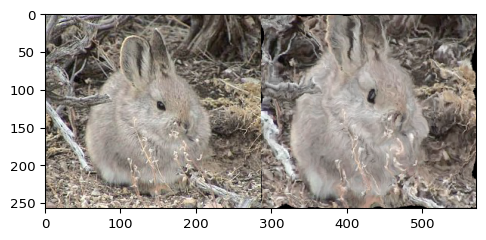

Image 1 (input shape: (536, 800, 3), output shape: (536, 800, 3))


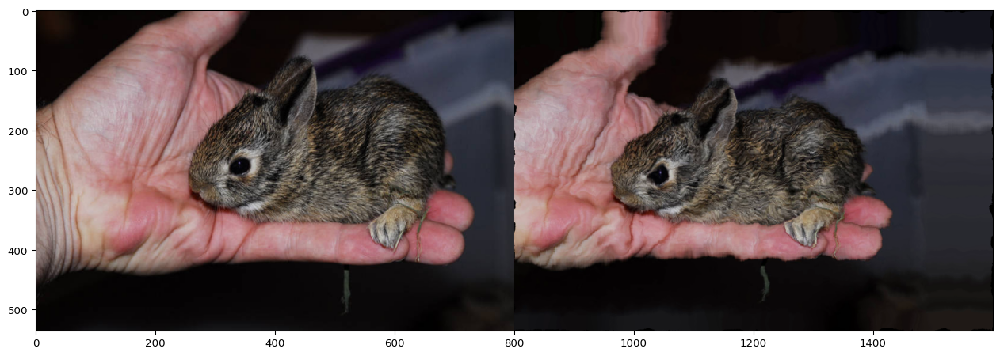

Image 2 (input shape: (289, 520, 3), output shape: (289, 520, 3))


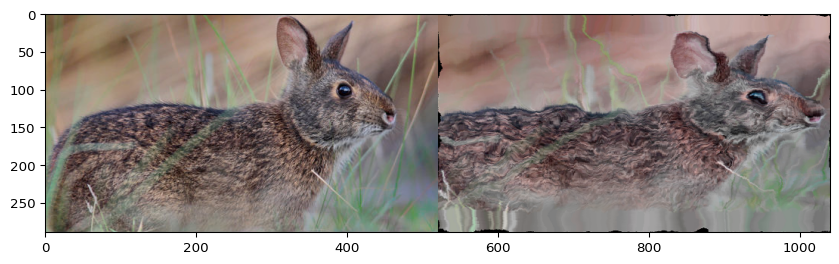

In [16]:
seq = iaa.Sequential([
    iaa.CropAndPad(percent=(-0.2, 0.2), pad_mode="edge"),  # crop and pad images
    iaa.AddToHueAndSaturation((-60, 60)),  # change their color
    iaa.ElasticTransformation(alpha=90, sigma=9)  # water-like effect
], random_order=True)

# load images with different sizes
images_different_sizes = [
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/e/ed/BRACHYLAGUS_IDAHOENSIS.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/c/c9/Southern_swamp_rabbit_baby.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/9/9f/Lower_Keys_marsh_rabbit.jpg")
]

# augment them as one batch
images_aug = seq(images=images_different_sizes)

# visualize the results
print("Image 0 (input shape: %s, output shape: %s)" % (images_different_sizes[0].shape, images_aug[0].shape))
ia.imshow(np.hstack([images_different_sizes[0], images_aug[0]]))

print("Image 1 (input shape: %s, output shape: %s)" % (images_different_sizes[1].shape, images_aug[1].shape))
ia.imshow(np.hstack([images_different_sizes[1], images_aug[1]]))

print("Image 2 (input shape: %s, output shape: %s)" % (images_different_sizes[2].shape, images_aug[2].shape))
ia.imshow(np.hstack([images_different_sizes[2], images_aug[2]]))